In [1]:
using StatsPlots
using CSV, DataFrames
using Distributions
using Turing 
using StatsBase
using StatisticalRethinking

Code 4.1: A Random Walk example for Normal by Addition
---

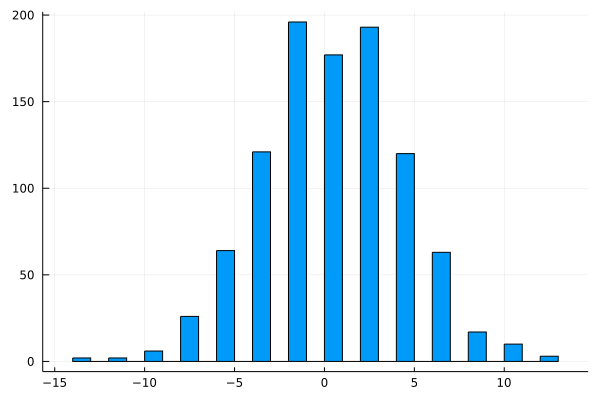

In [22]:
histogram([sum(rand([-1,1],16)) for i in 1:1000], legend=false)
# 1000 experiments with 16 steps..

Code 4.3: Normal by Multiplication 
---

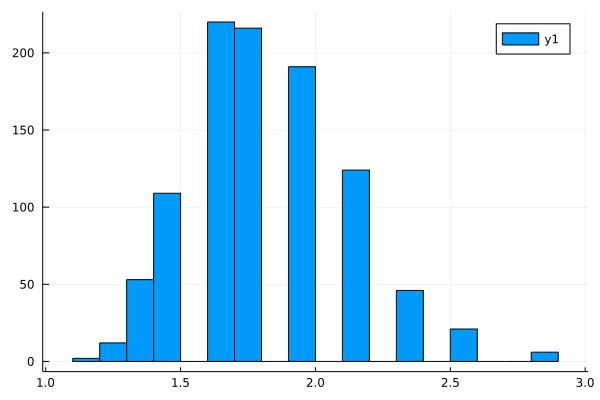

In [28]:
histogram([prod(1 .+ rand([0,0.1],12)) for i in 1:1000])

Code 4.4: Normal by Log-multiplication
---

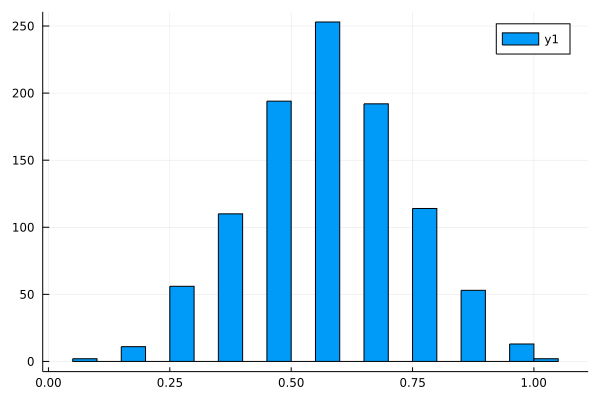

In [29]:
histogram([log(prod(1 .+ rand([0,0.1],12))) for i in 1:1000])

Code 4.7 - 4.9: DataFrames
---

In [2]:
d = CSV.File(joinpath("data","Howell1.csv")) |> DataFrame;
describe(d)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,height,138.264,53.975,148.59,179.07,0,Float64
2,weight,35.6106,4.25242,40.0578,62.9926,0,Float64
3,age,29.3444,0.0,27.0,88.0,0,Float64
4,male,0.472426,0,0.0,1,0,Int64


Code 4.11: 
---

In [3]:
d2 = d[d.age.>=18,:];

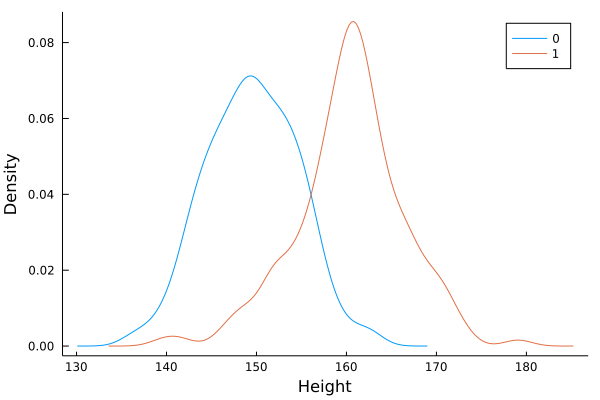

In [4]:
density(d2.height, group=d2.male, grid=:none, xlabel="Height", ylabel="Density")

Code 4.12: Prior to mean
---

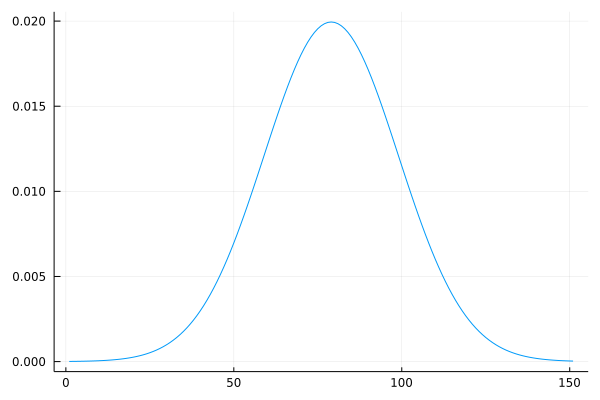

In [101]:
plot(pdf(Normal(178,20),100:250), legend=false)

Code 4.13: Prior to SD
---

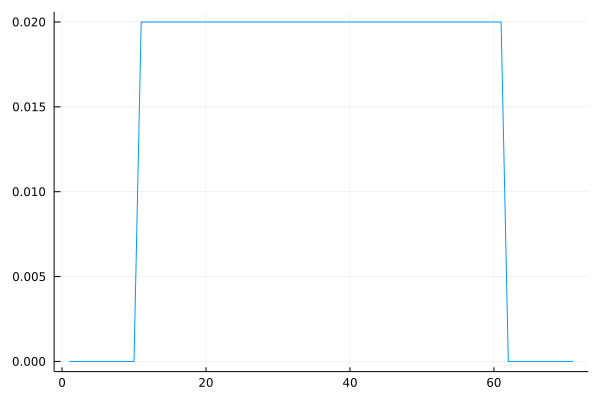

In [100]:
plot(pdf(Uniform(0,50),-10:60), legend=false)

Code 4.14: Prior Predictive Simulation
---

mean(h_prior) = 177.9614014120465
mode(h_prior) = 155.2152618873534
median(h_prior) = 177.7183315829486


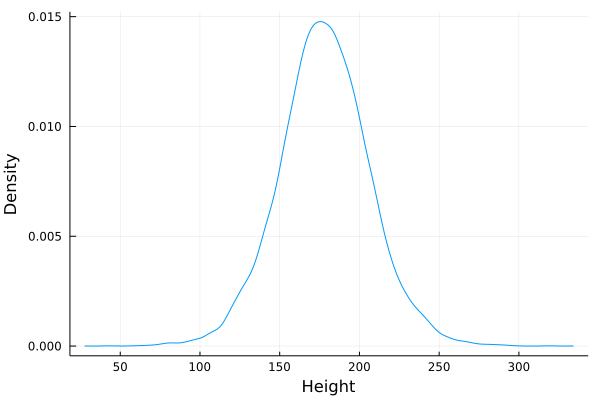

In [5]:
μ_sample = rand(Normal(178,20),10000);
σ_sample = rand(Uniform(0,35),10000);
h_prior = rand.(Normal.(μ_sample, σ_sample))
@show mean(h_prior);
@show mode(h_prior);
@show median(h_prior);
density(h_prior, legend=false, xlabel="Height", ylabel="Density")

In [12]:
h = [missing for i in 1:1000]
p_sample = line(h)

LoadError: MethodError: no method matching sample(::DynamicPPL.Model{var"#3#4", (:height,), (), (), Tuple{Vector{Missing}}, Tuple{}}, ::Prior)
[0mClosest candidates are:
[0m  sample(::AbstractMCMC.AbstractModel, ::Turing.Inference.InferenceAlgorithm, [91m::AbstractMCMC.AbstractMCMCParallel[39m, [91m::Integer[39m, [91m::Integer[39m; kwargs...) at C:\Users\axs162731\.julia\packages\Turing\Gntg0\src\inference\Inference.jl:180
[0m  sample(::AbstractMCMC.AbstractModel, ::Turing.Inference.InferenceAlgorithm, [91m::Integer[39m; kwargs...) at C:\Users\axs162731\.julia\packages\Turing\Gntg0\src\inference\Inference.jl:125
[0m  sample([91m::Chains[39m, ::Any; kwargs...) at C:\Users\axs162731\.julia\packages\MCMCChains\hT0hR\src\sampling.jl:9
[0m  ...

In [16]:
@model function line(height)
    μ ~ Normal(178,20)
    σ ~ Uniform(0,50)
    
    height .~ Normal.(μ, σ)
end

model1 = line(d2.height)

DynamicPPL.Model{var"#17#18", (:height,), (), (), Tuple{Vector{Float64}}, Tuple{}}(:line, var"#17#18"(), (height = [151.765, 139.7, 136.525, 156.845, 145.415, 163.83, 149.225, 168.91, 147.955, 165.1  …  156.21, 160.655, 146.05, 156.21, 152.4, 162.56, 142.875, 162.56, 156.21, 158.75],), NamedTuple())

In [17]:
chain1 = sample(model1, NUTS(),1000)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia\packages\AdvancedHMC\MIxdK\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia\packages\AdvancedHMC\MIxdK\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia\packages\AdvancedHMC\MIxdK\src\hamiltonian.jl:47
┌ Info: Found initial step size
│   ϵ = 0.00625
└ @ Turing.Inference C:\Users\axs162731\.julia\packages\Turing\Gntg0\src\inference\hmc.jl:188
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia

Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 1:1000
Thinning interval = 1
Chains            = 1
Samples per chain = 1000
parameters        = μ, σ
internals         = acceptance_rate, hamiltonian_energy, hamiltonian_energy_error, is_accept, log_density, lp, max_hamiltonian_energy_error, n_steps, nom_step_size, numerical_error, step_size, tree_depth

Summary Statistics
  parameters       mean       std   naive_se      mcse         ess      rhat 
      Symbol    Float64   Float64    Float64   Float64     Float64   Float64 

           μ   154.5832    0.4071     0.0129    0.0089    910.7235    1.0001
           σ     7.7748    0.2931     0.0093    0.0086   1072.7328    0.9990

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

           μ   153.8224   154.3080   154.5891   154.8460   155.3738
           σ     7.1871     7.5808     7.7510     7.9609     8.4100


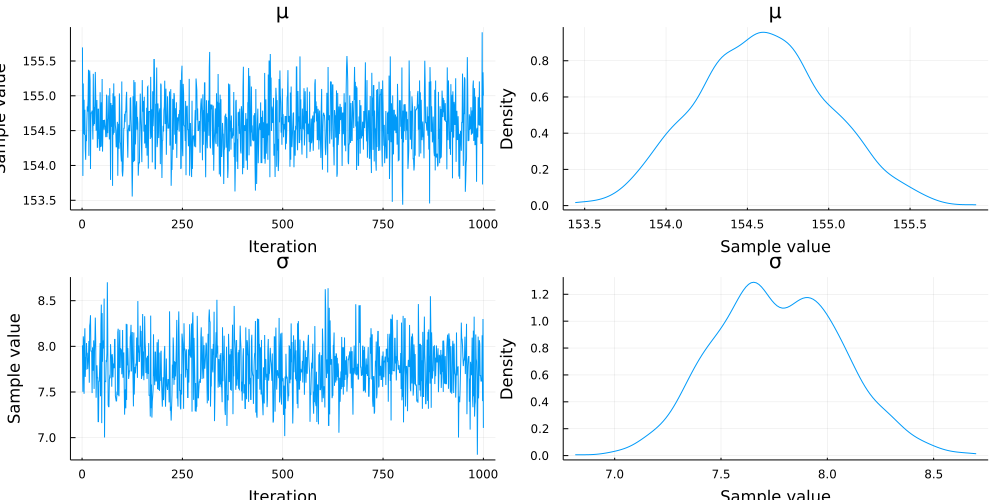

In [180]:
plot(chain1)

┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia\packages\AdvancedHMC\MIxdK\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia\packages\AdvancedHMC\MIxdK\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia\packages\AdvancedHMC\MIxdK\src\hamiltonian.jl:47
┌ Warning: The current proposal will be rejected due to numerical error(s).
│   isfinite.((θ, r, ℓπ, ℓκ)) = (true, false, false, false)
└ @ AdvancedHMC C:\Users\axs162731\.julia\packages\AdvancedHMC\MIxdK\src\hamiltonian.jl:47
┌ Info: Found initial step size
│   ϵ = 0.003125
└ @ Turing.Inference C:\Users\axs162731\.ju

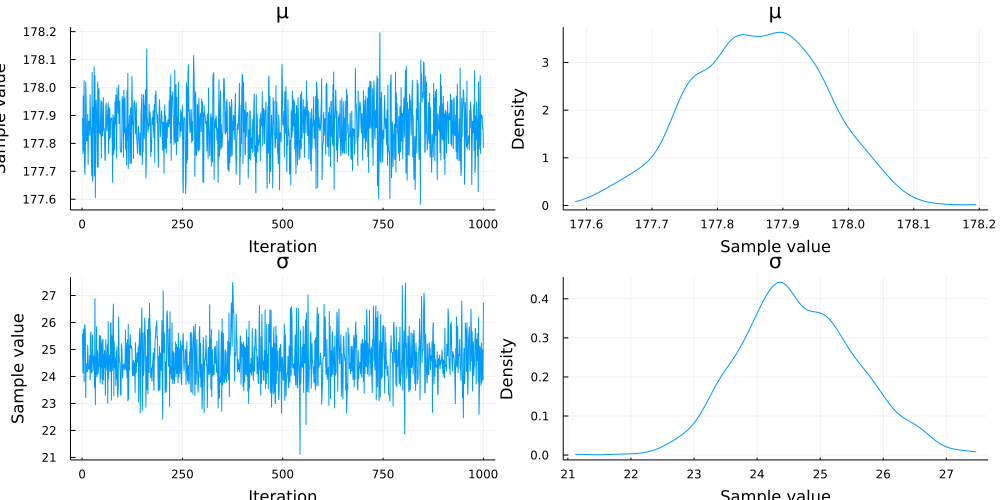

In [181]:
@model function line(height)
    μ ~ Normal(178,0.1)
    σ ~ Uniform(0,50)
    
    height .~ Normal.(μ, σ)
end

model2 = line(d2.height)
chain2 = sample(model2, NUTS(),1000);
plot(chain2)

In [220]:
StatsBase.cov(vec(rand(chain2[:μ],1000)),vec(rand(chain2[:σ],1000)))

-0.0010214340594916916

Code 4.37: Height vs Weight 
---

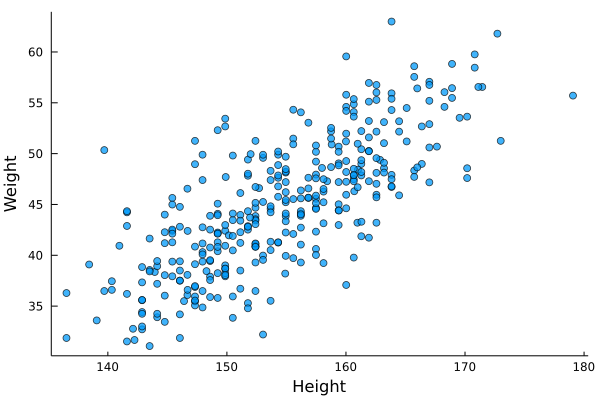

In [225]:
scatter(d2.height, d2.weight, legend=false, xlabel="Height", ylabel = "Weight", alpha = 0.75, grid=false)

Code 4.39
---

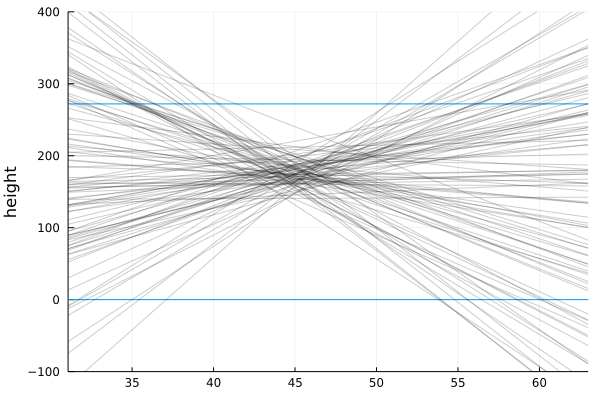

In [239]:
α = rand(Normal(178,20),100);
β = rand(Normal(0,10),100);

x̄ = mean(d2.weight);
x = range(minimum(d2.weight), maximum(d2.weight), length=100);
plot(xlims = extrema(d2.weight), ylims = (-100, 400), xlable = "weight", ylabel = "height")
hline!([0.0, 272.0])

for (α, β) in zip(α, β)
    plot!(x, α .+ β .* (x .- x̄), color = "black", alpha = 0.2)
end
plot!(legend = false)

Code 4. 40
---

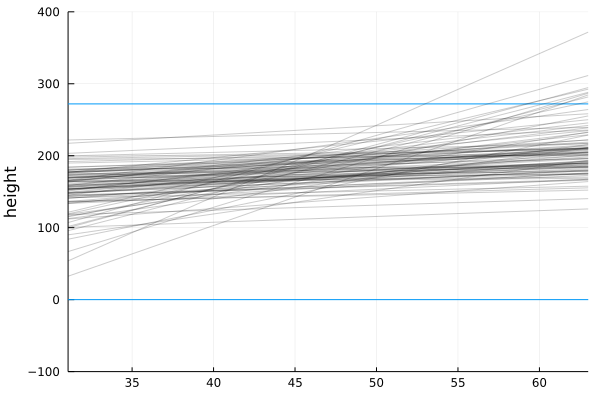

In [242]:
α = rand(Normal(178,20),100);
β = rand(LogNormal(0,1),100);

x̄ = mean(d2.weight);
x = range(minimum(d2.weight), maximum(d2.weight), length=100);
plot(xlims = extrema(d2.weight), ylims = (-100, 400), xlable = "weight", ylabel = "height")
hline!([0.0, 272.0])

for (α, β) in zip(α, β)
    plot!(x, α .+ β .* (x .- x̄), color = "black", alpha = 0.2)
end
plot!(legend = false)

In [308]:
@model function linear(weights, heights)
    a ~ Normal(178, 20)
    b ~ LogNormal(0, 1)
    σ ~ Uniform(0, 50)
    μ = a .+ b .* (weights .- x̄)
    heights ~ MvNormal(μ, σ)
end

linear (generic function with 1 method)

In [324]:
linear_model = linear(d2.height, d2.weight)
chain = sample(linear_model, PG(100) ,5000);

Sampling: 100%|█████████████████████████████████████████| Time: 0:00:44


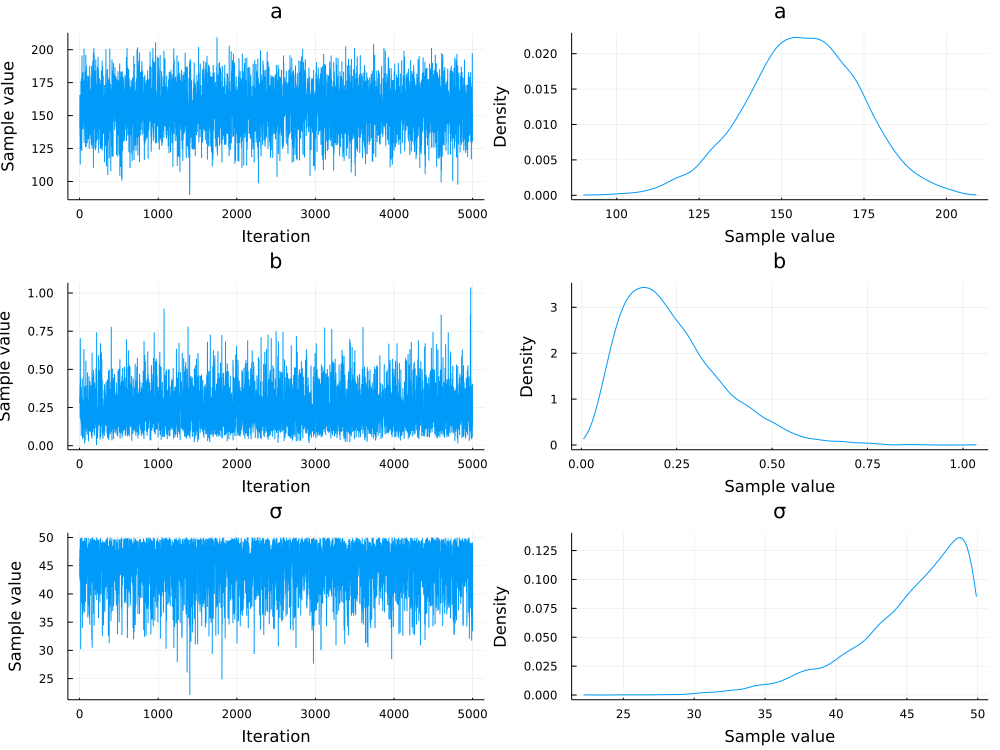

In [325]:
plot(chain)

In [326]:
chain

Chains MCMC chain (5000×5×1 Array{Float64, 3}):

Log evidence      = -3335.547945335044
Iterations        = 1:5000
Thinning interval = 1
Chains            = 1
Samples per chain = 5000
parameters        = a, b, σ
internals         = logevidence, lp

Summary Statistics
  parameters       mean       std   naive_se      mcse         ess      rhat 
      Symbol    Float64   Float64    Float64   Float64     Float64   Float64 

           a   156.4163   17.1937     0.2432    0.2387   4997.8137    0.9998
           b     0.2374    0.1304     0.0018    0.0014   5046.3182    0.9998
           σ    45.1656    4.0019     0.0566    0.0627   5178.7546    0.9999

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

           a   120.8454   145.1153   156.6083   168.4306   189.2925
           b     0.0560     0.1392     0.2128     0.3094     0.5428
           σ    35.1675    43.0758    46.1588    48.3066  

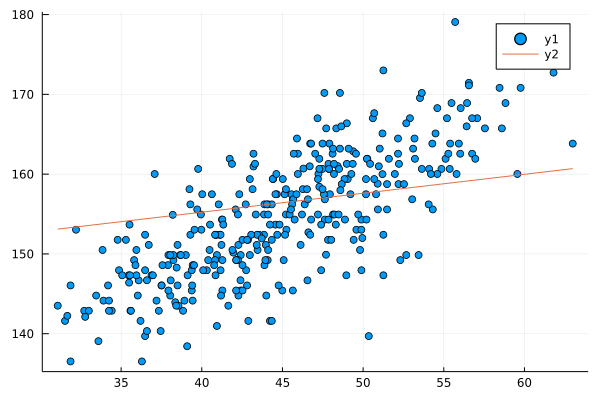

In [333]:
a_map = mean(chain[:a])
b_map = mean(chain[:b])
scatter(d2.weight, d2.height)
plot!(x, a_map .+ b_map .*(x .-x̄))

# The model didn't fit properly. Model fits changing according to sampler. Need's fixing. 

In [338]:
sample(chain,1000)

Chains MCMC chain (1000×5×1 Array{Float64, 3}):

Iterations        = 1:1000
Thinning interval = 1
Chains            = 1
Samples per chain = 1000
parameters        = a, b, σ
internals         = logevidence, lp

Summary Statistics
  parameters       mean       std   naive_se      mcse         ess      rhat 
      Symbol    Float64   Float64    Float64   Float64     Float64   Float64 

           a   156.9361   17.0117     0.5380    0.2412   1105.5004    0.9997
           b     0.2307    0.1324     0.0042    0.0033    978.7824    0.9991
           σ    45.0550    4.0890     0.1293    0.1415    996.6900    0.9990

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

           a   123.3088   145.5391   157.0188   168.4558   189.4808
           b     0.0525     0.1304     0.2011     0.3053     0.5380
           σ    34.9317    42.9973    46.0520    48.2572    49.8322


Code 4.50 - 4.52
---

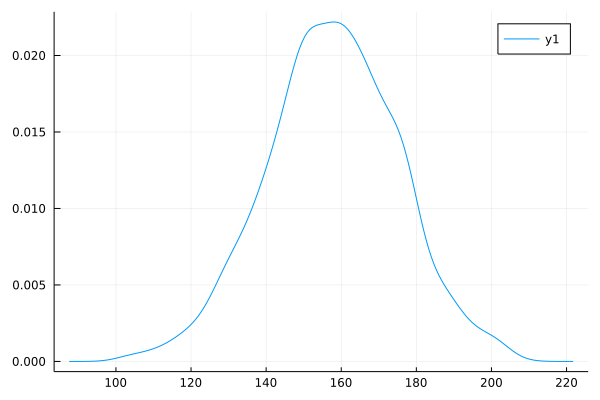

In [369]:
post = chain[1:1000];
postdf = DataFrame(a = [post[:a]...], b = [post[:b]...]);
μ_50 = postdf.a .+ postdf.b .* (50  - x̄);
density(μ_50)

In [371]:
PI(μ_50)

LoadError: UndefVarError: PI not defined

In [383]:
mu = StatisticalRethinking.link(postdf, [:a, :b], 25:70)

46-element Vector{Vector{Float64}}:
 [148.55516312022357, 148.26106509294362, 155.9202024088173, 173.91593053823067, 145.13615468132062, 163.55316228345555, 164.1607834522011, 124.01379558429451, 163.1009753899189, 158.64041490893354  …  149.12466172847334, 160.48132965612578, 148.42892944301244, 170.63175084326048, 154.796579772755, 155.8609064495814, 162.32007114231402, 150.19518522612609, 182.60826027429735, 146.5734731976306]
 [148.86503511922172, 148.53843160248846, 156.2308674141054, 174.24537069934985, 145.53564955181866, 163.9329894283913, 164.3443646564764, 124.46130665807011, 163.80524134707952, 158.8707185813426  …  149.42627792492306, 160.63432956589287, 148.6564918465603, 170.93602652723615, 154.9494332387067, 156.01666214252666, 162.44507270566874, 150.2496988902623, 182.99252885861551, 146.7247919401852]
 [149.17490711821986, 148.8157981120333, 156.54153241939352, 174.574810860469, 145.93514442231674, 164.31281657332707, 164.52794586075166, 124.90881773184572, 164.509507

In [393]:
scatter(mu,alpha=0.1)

In [444]:
mu_reshaped = Matrix(reshape(reduce(hcat,mu),1000,46)')

46×1000 Matrix{Float64}:
 148.555  148.261  155.92   173.916  …  162.32   150.195  182.608  146.573
 148.865  148.538  156.231  174.245     162.445  150.25   182.993  146.725
 149.175  148.816  156.542  174.575     162.57   150.304  183.377  146.876
 149.485  149.093  156.852  174.904     162.695  150.359  183.761  147.027
 149.795  149.371  157.163  175.234     162.82   150.413  184.145  147.179
 150.105  149.648  157.474  175.563  …  162.945  150.468  184.53   147.33
 150.414  149.925  157.784  175.893     163.07   150.522  184.914  147.481
 150.724  150.203  158.095  176.222     163.195  150.577  185.298  147.633
 151.034  150.48   158.406  176.551     163.32   150.631  185.682  147.784
 151.344  150.757  158.716  176.881     163.445  150.686  186.067  147.935
 151.654  151.035  159.027  177.21   …  163.57   150.74   186.451  148.087
 151.964  151.312  159.338  177.54      163.695  150.795  186.835  148.238
 152.274  151.589  159.648  177.869     163.82   150.849  187.219  148.389
 

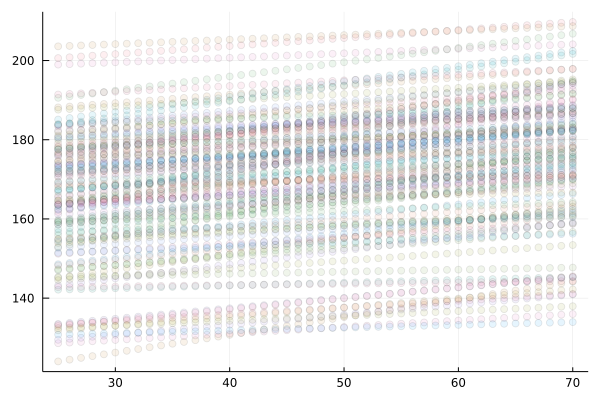

In [447]:
scatter(25:70, mu_reshaped[:,1:100], alpha=0.1, legend=false)

In [448]:
?meanloweupper

search: meanlowerupper

Couldn't find meanloweupper
Perhaps you meant meanlowerupper or meanlogx


No documentation found.

Binding `meanloweupper` does not exist.
